In [1]:
!nvidia-smi

Sat Nov 11 15:53:10 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla V100-SXM2...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   34C    P0    24W / 300W |      0MiB / 16384MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

#Install Dependencies


In [2]:
# clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5.git  # clone repo
%cd yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 16057, done.
remote: Total 16057 (delta 0), reused 0 (delta 0), pack-reused 16057
Receiving objects: 100% (16057/16057), 14.68 MiB | 25.13 MiB/s, done.
Resolving deltas: 100% (11032/11032), done.
/content/yolov5


In [3]:
# install dependencies as necessary
!pip install -qr requirements.txt  # install dependencies (ignore errors)
import torch

from IPython.display import Image, clear_output  # to display images
# from utils.google_utils import gdrive_download  # to download models/datasets

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.6/190.6 kB 4.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 23.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 645.2/645.2 kB 43.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 9.1 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
imageio 2.31.6 requires pillow<10.1.0,>=8.3.2, but you have pillow 10.1.0 which is incompatible.
Setup complete. Using torch 2.1.0+cu118 _CudaDeviceProperties(name='Tesla V100-SXM2-16GB', major=7, minor=0, total_memory=16150MB, multi_processor_count=80)


#My Custom Data

In [6]:
%cd /content
!unzip "/content/drive/MyDrive/YOLOv5/YOLOv5m/YOLO_v5m_Data.zip"

/content
Archive:  /content/drive/MyDrive/YOLOv5/YOLOv5m/YOLO_v5m_Data.zip
   creating: YOLO_v5m_Data/
  inflating: YOLO_v5m_Data/data.yaml.txt  
   creating: YOLO_v5m_Data/test/
   creating: YOLO_v5m_Data/test/images/
  inflating: YOLO_v5m_Data/test/images/1.jpeg  
  inflating: YOLO_v5m_Data/test/images/10.jpeg  
  inflating: YOLO_v5m_Data/test/images/105.jpeg  
  inflating: YOLO_v5m_Data/test/images/106.jpeg  
  inflating: YOLO_v5m_Data/test/images/11.jpeg  
  inflating: YOLO_v5m_Data/test/images/116.jpeg  
  inflating: YOLO_v5m_Data/test/images/12.jpeg  
  inflating: YOLO_v5m_Data/test/images/124.jpeg  
  inflating: YOLO_v5m_Data/test/images/13.jpeg  
  inflating: YOLO_v5m_Data/test/images/133.jpeg  
  inflating: YOLO_v5m_Data/test/images/136.jpeg  
  inflating: YOLO_v5m_Data/test/images/137.jpeg  
  inflating: YOLO_v5m_Data/test/images/138.jpeg  
  inflating: YOLO_v5m_Data/test/images/139.jpeg  
  inflating: YOLO_v5m_Data/test/images/14(1).jpeg  
  inflating: YOLO_v5m_Data/test/ima

In [7]:
!mv "/content/YOLO_v5m_Data/test"* "/content"

In [8]:
!mv "/content/YOLO_v5m_Data/train"* "/content"

In [9]:
!mv "/content/YOLO_v5m_Data/val"* "/content"

In [10]:
!mv "/content/YOLO_v5m_Data/data.yaml.txt"* "/content"

In [11]:
# this is the YAML file  we're loading into this notebook with our data
%cat data.yaml

train: ../train/images
val: ../val/images


# number of classes
nc: 5

# class names
names: ['Helmet','Goggles','Jacket','Gloves','Footwear']

# Define Model Configuration and Architecture

We will write a yaml script that defines the parameters for our model like the number of classes, anchors, and each layer.



In [12]:
# define number of classes based on YAML
import yaml
with open("data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [13]:
num_classes

'5'

In [14]:
#this is the model configuration we will use
%cat /content/yolov5/models/yolov5m.yaml

# YOLOv5 🚀 by Ultralytics, AGPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.67  # model depth multiple
width_multiple: 0.75  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]

In [15]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [16]:
%%writetemplate /content/yolov5/models/custom_yolov5m.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

# Train Custom YOLOv5 Detector



In [17]:
# train yolov5s on custom data for 100 epochs
# time its performance
%%time
%cd /content/yolov5/
!python train.py --img 640 --batch 16 --epochs 100 --data '/content/data.yaml' --cfg /content/yolov5/models/custom_yolov5m.yaml --weights 'yolov5m.pt' --name yolov5m_results  --cache

/content/yolov5
2023-11-11 16:08:52.313259: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-11-11 16:08:52.313323: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-11-11 16:08:52.313359: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5m.pt, cfg=/content/yolov5/models/custom_yolov5m.yaml, data=/content/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, si

#Save yolov5s_results to Gdrive

In [18]:
!cp -r /content/yolov5/runs/train/yolov5m_results /content/drive/MyDrive/YOLOv5/YOLOv5m

# Evaluate Custom YOLOv5 Detector Performance

Training losses and performance metrics are saved to Tensorboard and also to a logfile defined above with the **--name** flag when we train. In our case, we named this `yolov5s_results`. (If given no name, it defaults to `results.txt`.) The results file is plotted as a png after training completes.

Note from Glenn: Partially completed `results.txt` files can be plotted with `from utils.utils import plot_results; plot_results()`.

In [19]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

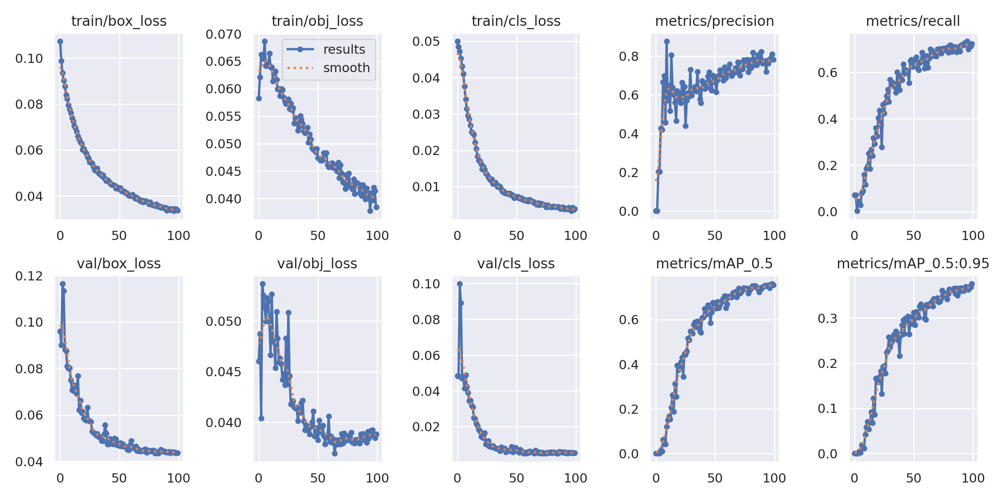

In [20]:
# we can also output some older school graphs if the tensor board isn't working for whatever reason...
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/yolov5m_results/results.png', width=1000)  # view results.png

### Curious? Visualize Our Training Data with Labels

After training starts, view `train*.jpg` images to see training images, labels and augmentation effects.

Note a mosaic dataloader is used for training (shown below), a new dataloading concept developed by Glenn Jocher and first featured in [YOLOv4](https://arxiv.org/abs/2004.10934).

GROUND TRUTH TRAINING DATA:


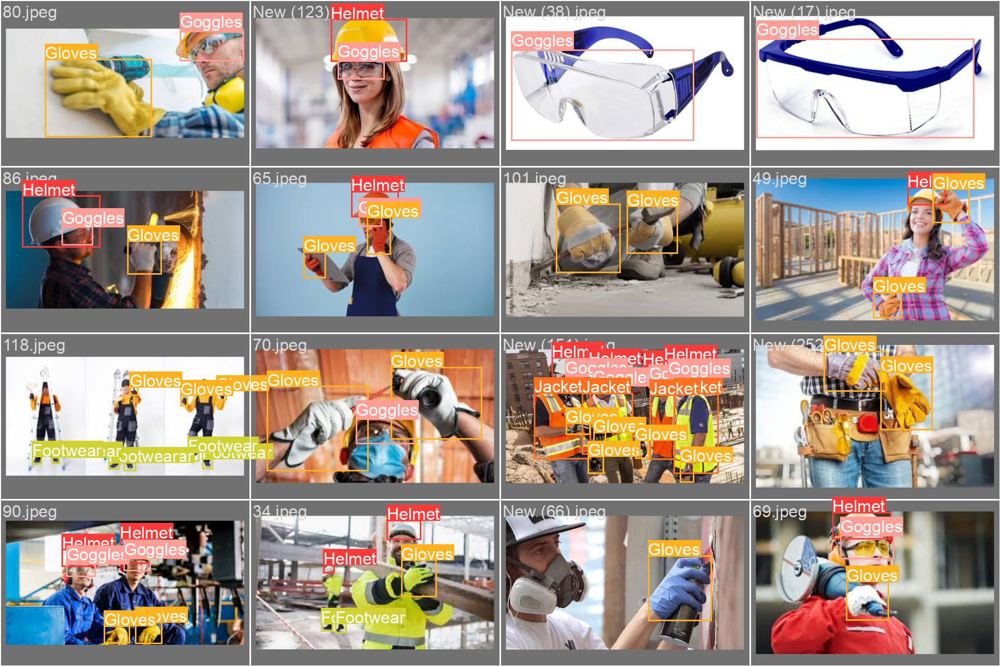

In [22]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5m_results/val_batch0_labels.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


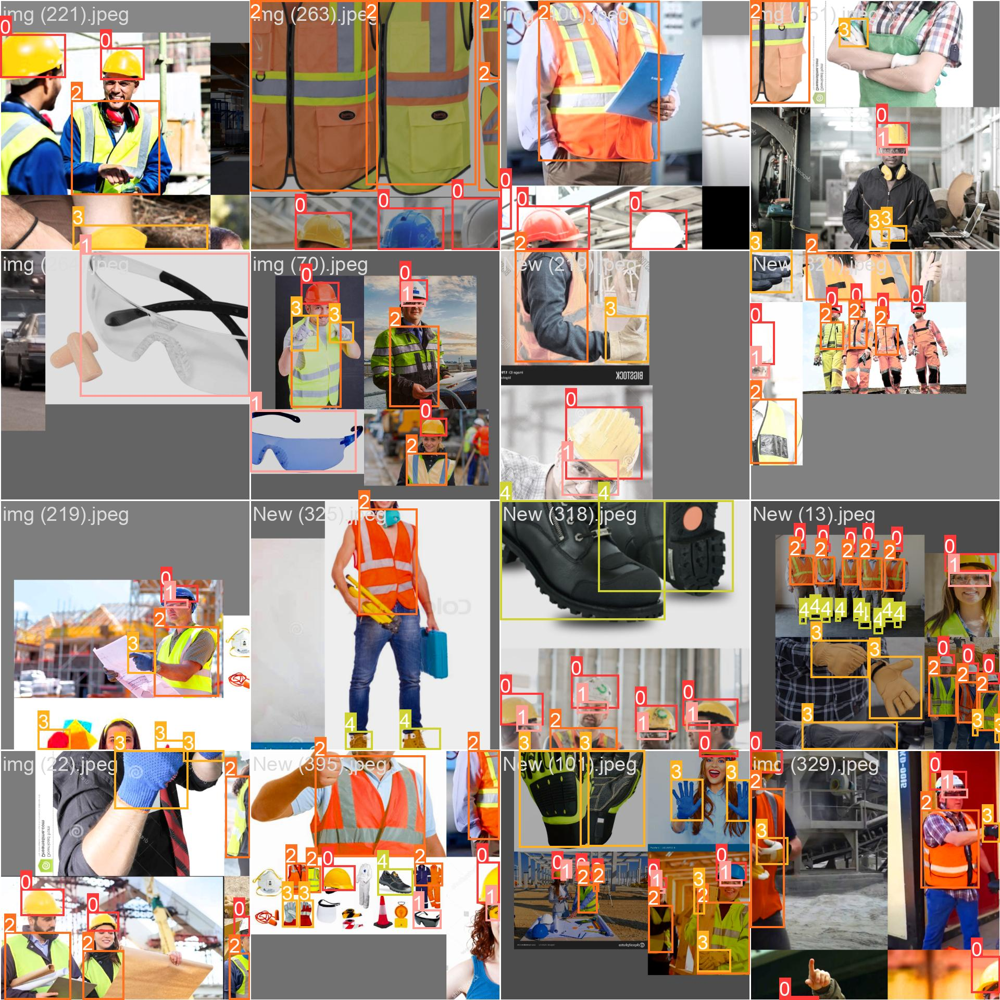

In [23]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5m_results/train_batch0.jpg', width=900)

#Detect from Images and Videos

In [24]:
# Run
!python detect.py --weights /content/yolov5/runs/train/yolov5m_results/weights/best.pt  --source /content/001.jpeg

detect: weights=['/content/yolov5/runs/train/yolov5m_results/weights/best.pt'], source=/content/001.jpeg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-240-g84ec8b5 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)

Fusing layers... 
custom_YOLOv5m summary: 182 layers, 7257306 parameters, 0 gradients
image 1/1 /content/001.jpeg: 384x640 3 Helmets, 2 Goggless, 3 Jackets, 43.1ms
Speed: 0.4ms pre-process, 43.1ms inference, 73.8ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp


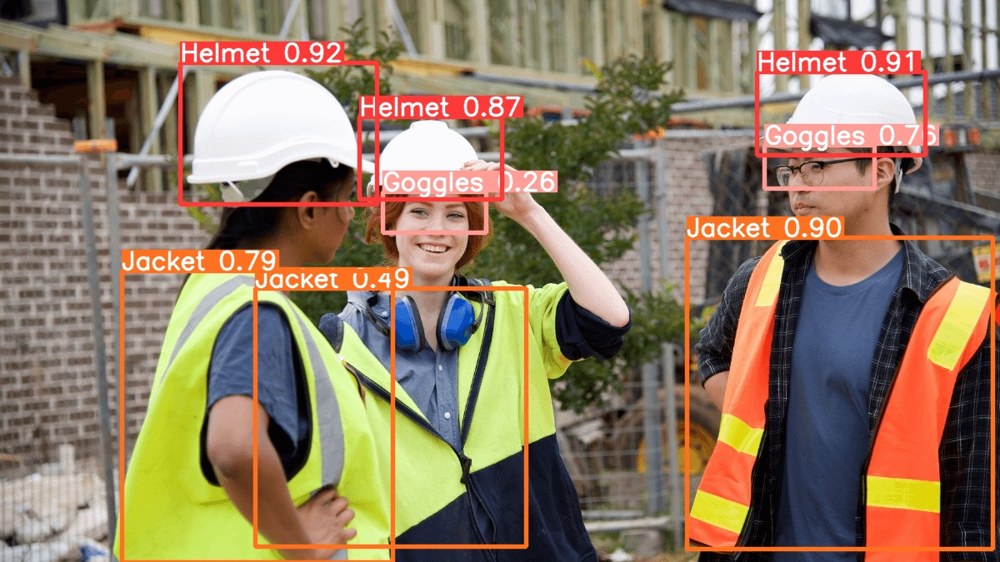

In [25]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

i = 0
limit = 10000 # max images to print
for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpeg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n")
    i = i + 1

In [27]:
# Run
!python detect.py --weights /content/yolov5/runs/train/yolov5m_results/weights/best.pt  --source /content/0013.jpg

detect: weights=['/content/yolov5/runs/train/yolov5m_results/weights/best.pt'], source=/content/0013.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-240-g84ec8b5 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)

Fusing layers... 
custom_YOLOv5m summary: 182 layers, 7257306 parameters, 0 gradients
image 1/1 /content/0013.jpg: 448x640 6 Helmets, 5 Goggless, 5 Jackets, 42.0ms
Speed: 0.5ms pre-process, 42.0ms inference, 76.5ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp3


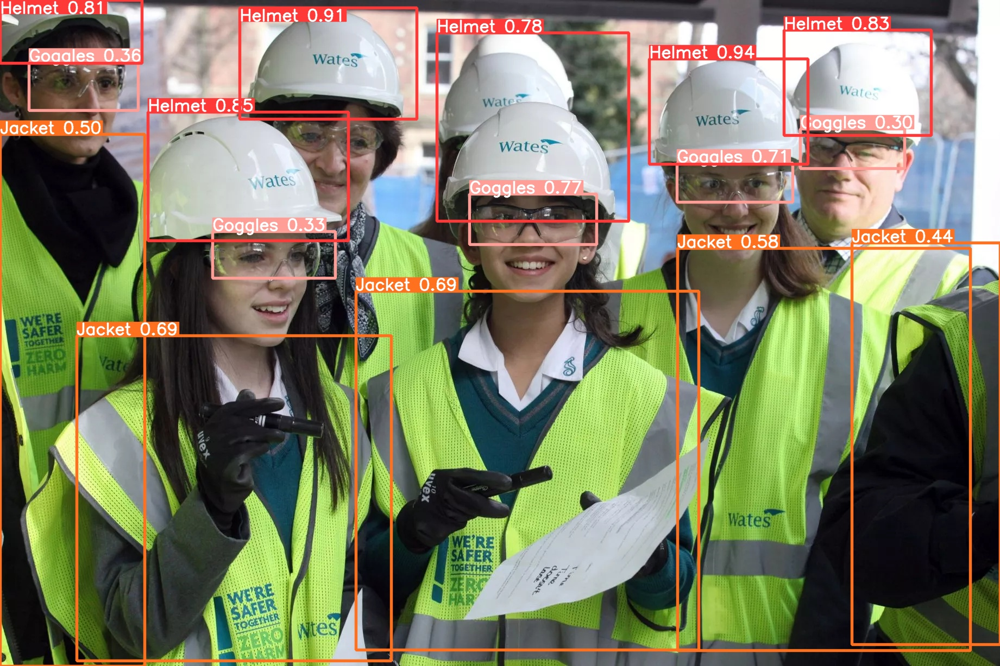

In [28]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

i = 0
limit = 10000 # max images to print
for imageName in glob.glob('/content/yolov5/runs/detect/exp3/*.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n")
    i = i + 1

In [29]:
# Run
!python detect.py --weights /content/yolov5/runs/train/yolov5m_results/weights/best.pt  --source /content/0012.jpg

detect: weights=['/content/yolov5/runs/train/yolov5m_results/weights/best.pt'], source=/content/0012.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-240-g84ec8b5 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)

Fusing layers... 
custom_YOLOv5m summary: 182 layers, 7257306 parameters, 0 gradients
image 1/1 /content/0012.jpg: 576x640 2 Helmets, 2 Jackets, 39.5ms
Speed: 0.5ms pre-process, 39.5ms inference, 94.6ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp4


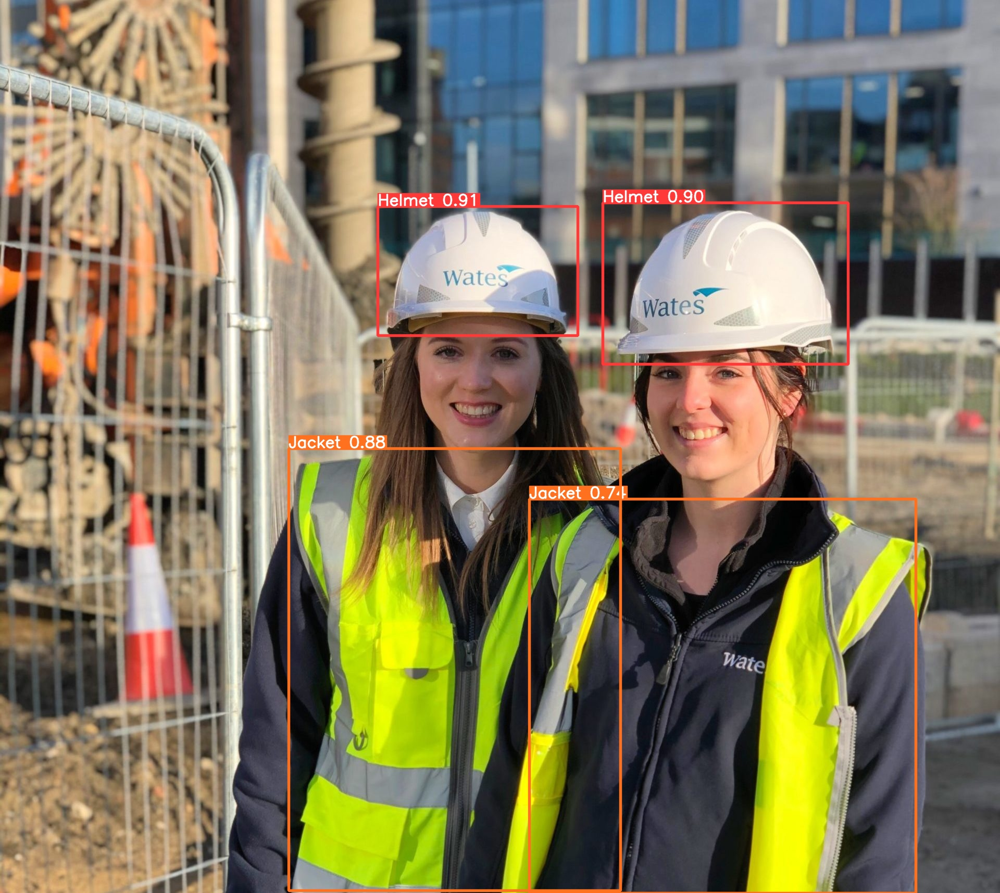

In [30]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

i = 0
limit = 10000 # max images to print
for imageName in glob.glob('/content/yolov5/runs/detect/exp4/*.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n")
    i = i + 1

In [33]:
# Run
!python detect.py --weights /content/yolov5/runs/train/yolov5m_results/weights/best.pt  --source /content/006.jpg

detect: weights=['/content/yolov5/runs/train/yolov5m_results/weights/best.pt'], source=/content/006.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-240-g84ec8b5 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)

Fusing layers... 
custom_YOLOv5m summary: 182 layers, 7257306 parameters, 0 gradients
image 1/1 /content/006.jpg: 448x640 1 Helmet, 1 Jacket, 2 Glovess, 1 Footwear, 44.4ms
Speed: 0.5ms pre-process, 44.4ms inference, 110.1ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp7


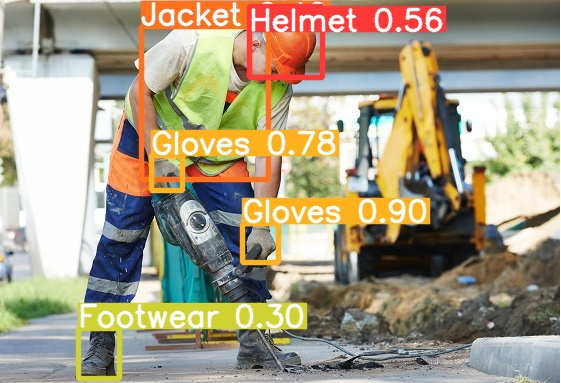

In [34]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

i = 0
limit = 10000 # max images to print
for imageName in glob.glob('/content/yolov5/runs/detect/exp7/*.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n")
    i = i + 1

In [35]:
# Run
!python detect.py --weights /content/yolov5/runs/train/yolov5m_results/weights/best.pt  --source /content/015.jpg

detect: weights=['/content/yolov5/runs/train/yolov5m_results/weights/best.pt'], source=/content/015.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-240-g84ec8b5 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)

Fusing layers... 
custom_YOLOv5m summary: 182 layers, 7257306 parameters, 0 gradients
image 1/1 /content/015.jpg: 448x640 5 Helmets, 6 Goggless, 5 Jackets, 1 Gloves, 11 Footwears, 62.9ms
Speed: 0.6ms pre-process, 62.9ms inference, 115.1ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp8


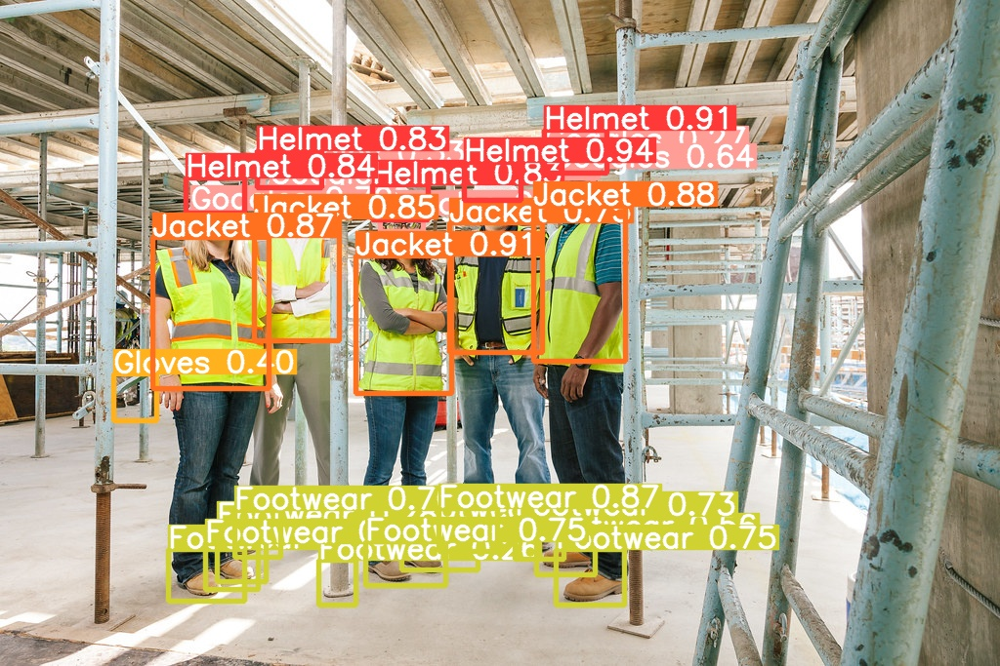

In [36]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

i = 0
limit = 10000 # max images to print
for imageName in glob.glob('/content/yolov5/runs/detect/exp8/*.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n")
    i = i + 1

In [37]:
# Run
!python detect.py --weights /content/yolov5/runs/train/yolov5m_results/weights/best.pt  --source /content/003.jpeg

detect: weights=['/content/yolov5/runs/train/yolov5m_results/weights/best.pt'], source=/content/003.jpeg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-240-g84ec8b5 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)

Fusing layers... 
custom_YOLOv5m summary: 182 layers, 7257306 parameters, 0 gradients
image 1/1 /content/003.jpeg: 416x640 4 Helmets, 1 Goggles, 3 Jackets, 40.0ms
Speed: 0.5ms pre-process, 40.0ms inference, 82.1ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp9


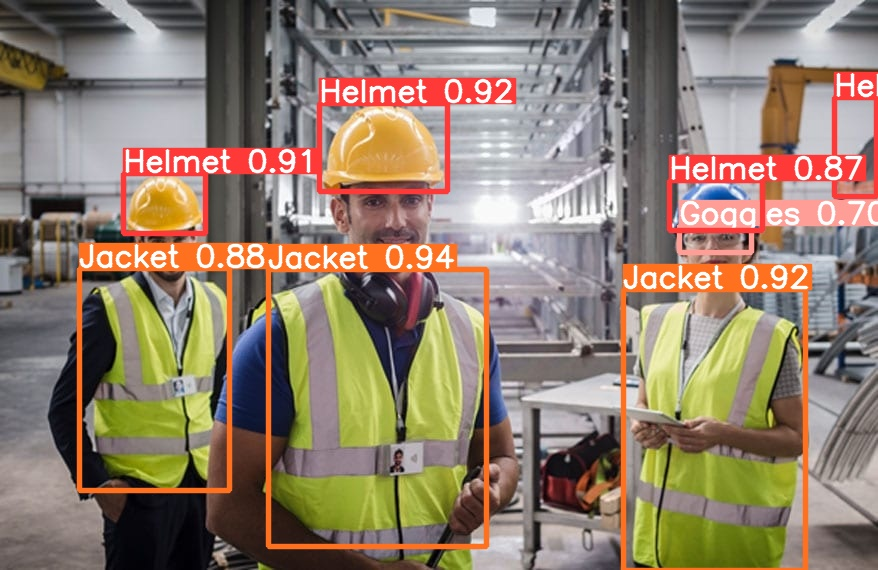

In [38]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

i = 0
limit = 10000 # max images to print
for imageName in glob.glob('/content/yolov5/runs/detect/exp9/*.jpeg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n")
    i = i + 1

In [39]:
# Run
!python detect.py --weights /content/yolov5/runs/train/yolov5m_results/weights/best.pt  --source /content/007.mp4

detect: weights=['/content/yolov5/runs/train/yolov5m_results/weights/best.pt'], source=/content/007.mp4, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-240-g84ec8b5 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)

Fusing layers... 
custom_YOLOv5m summary: 182 layers, 7257306 parameters, 0 gradients
video 1/1 (1/3715) /content/007.mp4: 384x640 (no detections), 41.9ms
video 1/1 (2/3715) /content/007.mp4: 384x640 (no detections), 6.6ms
video 1/1 (3/3715) /content/007.mp4: 384x640 (no detections), 6.4ms
video 1/1 (4/3715) /content/007.mp4: 384x640 (no detections), 6.3ms
video 1/1 (5/3715) /cont

In [40]:
# Run
!python detect.py --weights /content/yolov5/runs/train/yolov5m_results/weights/best.pt  --source /content/008.mp4

detect: weights=['/content/yolov5/runs/train/yolov5m_results/weights/best.pt'], source=/content/008.mp4, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-240-g84ec8b5 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)

Fusing layers... 
custom_YOLOv5m summary: 182 layers, 7257306 parameters, 0 gradients
video 1/1 (1/4196) /content/008.mp4: 384x640 (no detections), 42.6ms
video 1/1 (2/4196) /content/008.mp4: 384x640 (no detections), 7.3ms
video 1/1 (3/4196) /content/008.mp4: 384x640 (no detections), 7.7ms
video 1/1 (4/4196) /content/008.mp4: 384x640 (no detections), 6.7ms
video 1/1 (5/4196) /cont

In [41]:
!cp -r /content/yolov5/runs/detect /content/drive/MyDrive/YOLOv5/YOLOv5m